# Evaluation: Foggy Rail Segmentation
This notebook continues the segmentation evaluation process for the foggy rail track dataset.

## Initial Evaluation and Pseudo-Labeling Strategy
After running the baseline model (`bisenetv2_checkpoint_BiSeNetV2_epoch_300.pth`) on all foggy images using a custom script `batch_inference.py`, we stored the results in `output/fog_result`.

### Visual Observations
From the visual analysis of the segmentation outputs, several issues were identified:
- A canal near the railway was falsely detected as a track 
- Track branching structures were not segmented correctly
- Segmentation lines appeared rough and imprecise in some cases

Due to the lack of labeled ground truth masks for the foggy images, standard supervised training was not feasible.

### Pseudo-Labeling Approach
To enable fine-tuning, we generated pseudo-labels for clear-weather images:
- Ran the baseline model on `data/clear/images`
- Saved the resulting masks in `data/clear/masks`
- This process was automated via the script `generate_pseudo_labels.py`

### Fine-Tuning with Pseudo Labels
We used the pseudo-labeled data to fine-tune the baseline model:
- Script: `fine_tune_on_pseudo_labels.py`
- Training was done entirely on CPU
- Output model: `model/bisenetv2_finetuned.pth` (starting at epoch 301)

Afterward, we applied this updated model to the foggy test images again using `batch_inference_finetuned.py`.

The output segmentation results were saved in:
```
output/fog_results_finetuned/
```

This enabled a visual comparison between the original and improved models, as documented in the following sections.


In [1]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import entropy, skew
from scipy.spatial import distance

In [2]:
# Path
fog_dir = "data/fog"
baseline_dir = "output/fog_results"
finetuned_dir = "output/fog_results_finetuned"

images = sorted(os.listdir(fog_dir))

## Visual Evaluation of the Baseline model Vs. fine-tuned model

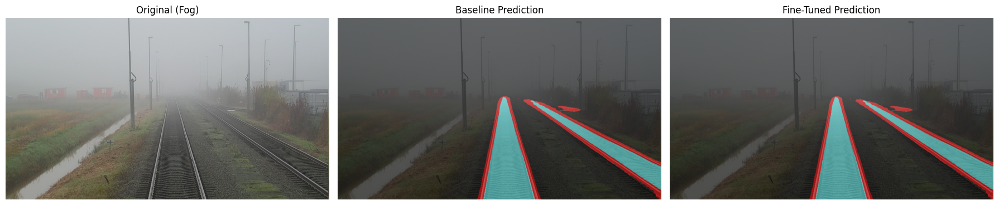

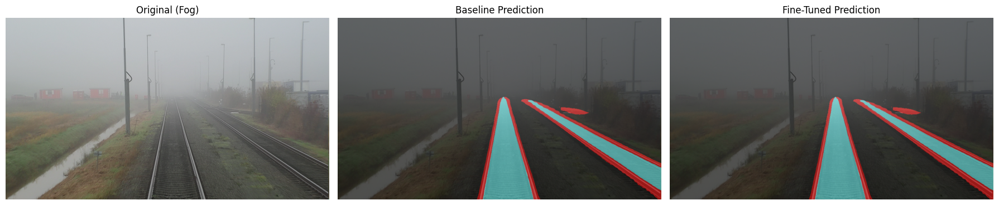

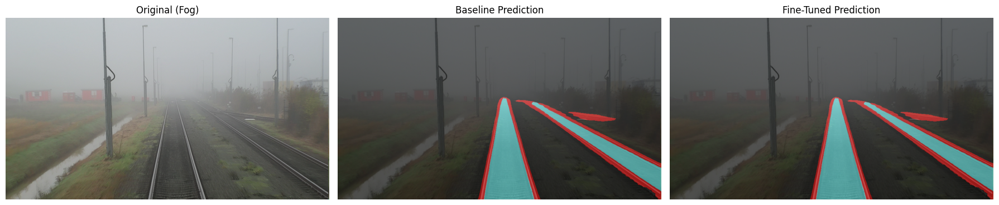

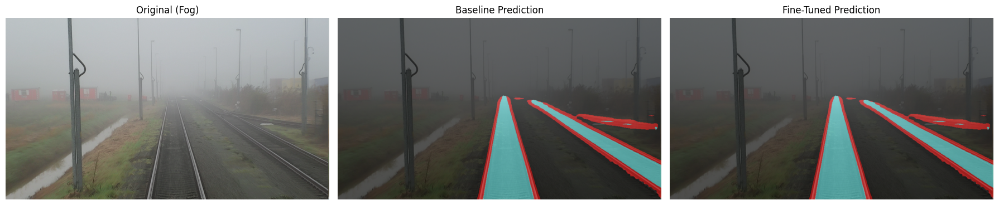

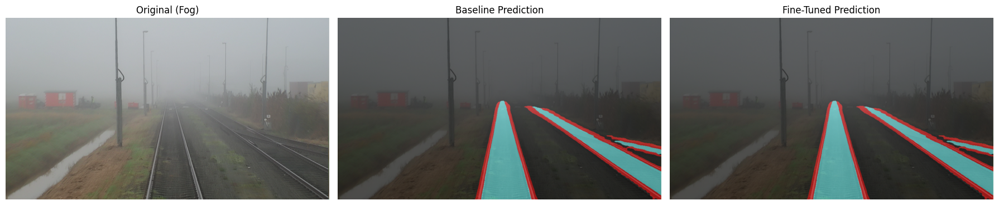

...

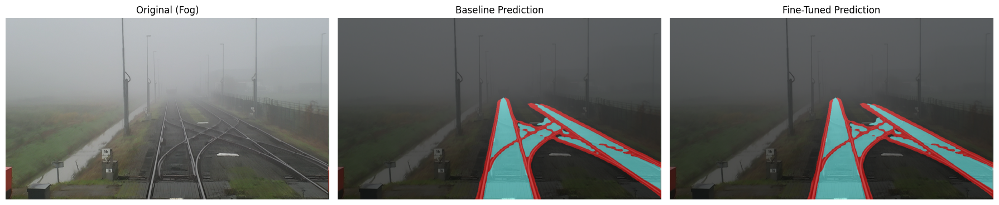

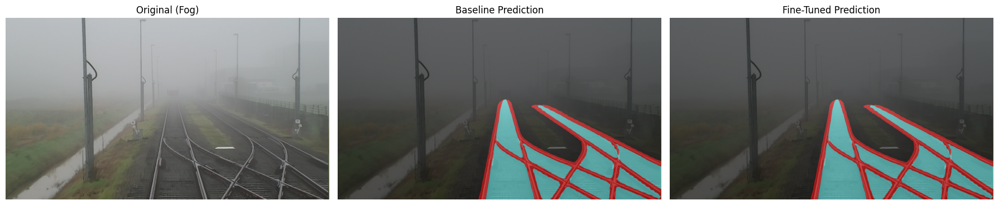

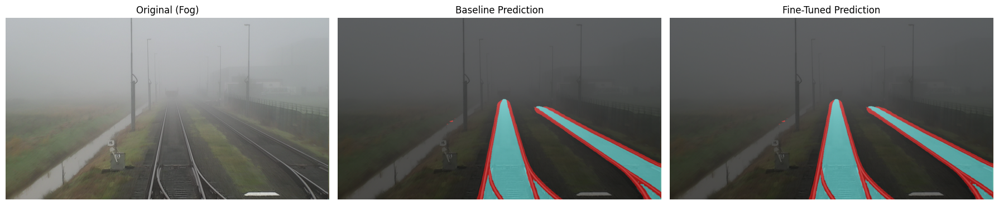

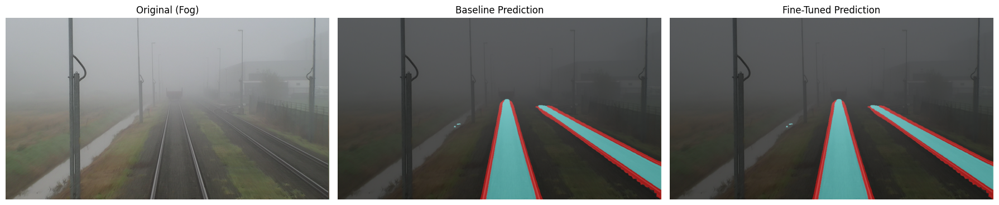

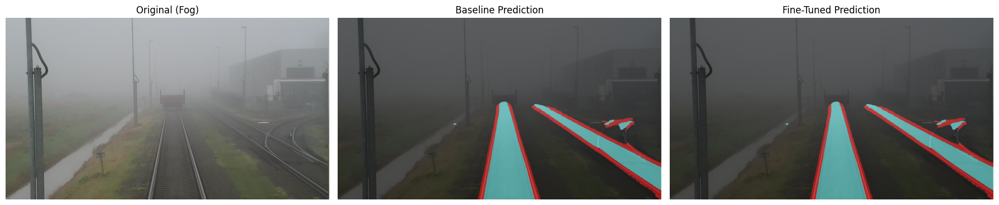

In [3]:
for name in images:  
    base_name = f"result_{name}"

    # Read images
    img = cv2.imread(os.path.join(fog_dir, name))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    baseline = cv2.imread(os.path.join(baseline_dir, base_name))
    baseline = cv2.cvtColor(baseline, cv2.COLOR_BGR2RGB)

    finetuned = cv2.imread(os.path.join(finetuned_dir, base_name))
    finetuned = cv2.cvtColor(finetuned, cv2.COLOR_BGR2RGB)

    # Image Presentation
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    axes[0].imshow(img)
    axes[0].set_title("Original (Fog)")
    axes[1].imshow(baseline)
    axes[1].set_title("Baseline Prediction")
    axes[2].imshow(finetuned)
    axes[2].set_title("Fine-Tuned Prediction")

    for ax in axes:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

## Visual & Quantitative Comparison Between Fog Images
During the visual observation, no significat changes can be observed in the fine-tuned predication. We still observed a **False Positive (FP)** prediction in one specific foggy image, where the model misclassified a **water canal** as rail tracks. 

### The next steps focuse on 
To better understand why this happened, we compare that image against several other foggy images where no such error occurred.

### This section includes:
- Brightness histogram for each image
- Canny edge detection to assess texture and structure
- Edge density and mean brightness values per image


Image                                    | Mean Bright | Edge Density
----------------------------------------------------------------------
123-2-1-29_11_2022-09_21_00_00000408.png |      134.85 | 10.32728
123-2-1-29_11_2022-09_21_00_00000552.png |      135.42 | 3.44316
123-2-1-29_11_2022-09_21_00_00000720.png |      135.76 | 3.46309
123-2-1-29_11_2022-09_21_00_00000816.png |      135.58 | 3.58815
123-2-1-29_11_2022-09_21_00_00001032.png |      134.99 | 2.23817
123-2-1-29_11_2022-09_21_00_00001344.png |      133.57 | 2.56134
123-2-1-29_11_2022-09_22_00_00001704.png |      132.47 | 4.85208
123-2-1-29_11_2022-09_22_00_00001896.png |      134.17 | 5.45168
123-2-1-29_11_2022-09_22_00_00002016.png |      136.55 | 3.23343
123-2-1-29_11_2022-09_22_00_00002304.png |      131.62 | 2.20994
123-2-1-29_11_2022-09_22_00_00002712.png |      129.70 | 2.39893


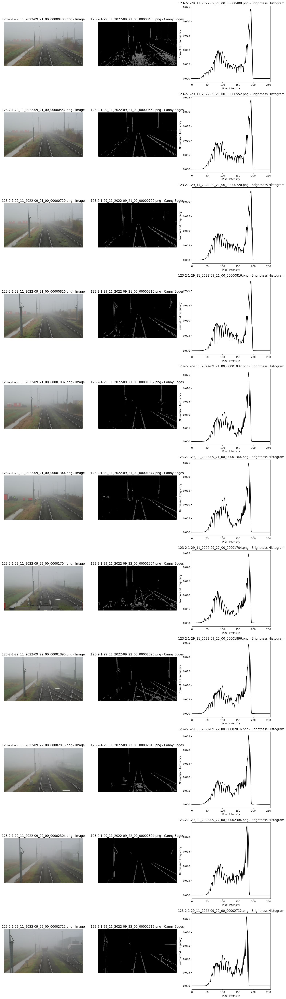

In [10]:
# Directory containing fog images
fog_dir = "data/fog"
image_files = sorted([f for f in os.listdir(fog_dir) if f.endswith(".png")])

# Prepare figure with dynamic size
fig, axes = plt.subplots(len(image_files), 3, figsize=(15, 5 * len(image_files)))

print(f"{'Image':<40} | Mean Bright | Edge Density")
print("-" * 70)

for i, filename in enumerate(image_files):
    path = os.path.join(fog_dir, filename)
    img = cv2.imread(path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Histogram
    hist = cv2.calcHist([gray], [0], None, [256], [0, 256])
    hist /= hist.sum()

    # Mean brightness
    mean_brightness = np.mean(gray)

    # Canny edges
    edges = cv2.Canny(gray, 100, 200)
    edge_density = edges.sum() / edges.size

    # Print statistics
    print(f"{filename:<40} | {mean_brightness:11.2f} | {edge_density:.5f}")

    # Plot original image
    axes[i, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title(f"{filename} - Image")
    axes[i, 0].axis("off")

    # Plot edge map
    axes[i, 1].imshow(edges, cmap="gray")
    axes[i, 1].set_title(f"{filename} - Canny Edges")
    axes[i, 1].axis("off")

    # Plot histogram
    axes[i, 2].plot(hist, color="black")
    axes[i, 2].set_title(f"{filename} - Brightness Histogram")
    axes[i, 2].set_xlabel("Pixel Intensity")
    axes[i, 2].set_ylabel("Normalized Frequency")
    axes[i, 2].set_xlim([0, 256])

plt.tight_layout()
plt.show()

## Histogram-Based Statistical Comparison

To better distinguish the false positive (FP) image from the others, we analyze their grayscale intensity distributions using quantitative methods beyond simple histogram plots.

This section includes:
- Standard deviation of brightness
- Entropy (overall variability)
- Histogram skewness (bias towards bright pixels)
- Bhattacharyya distance to compare each image's histogram to the FP image

Additionally, it's worth noting that the FP image uniquely contains a human figure near the center. This could be a contributing factor for the model's confusion, as the human contour may be misinterpreted as part of the rail structure under fog conditions.


In [8]:
fog_dir = "data/fog"
fp_image = "123-2-1-29_11_2022-09_21_00_00001344.png" # False Positive Image
fp_path = os.path.join(fog_dir, fp_image)

# Histogram stats function
def get_histogram_stats(img_path):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    hist = cv2.calcHist([img], [0], None, [256], [0, 256]).flatten()
    hist_norm = hist / hist.sum()

    std = np.std(hist_norm)
    ent = entropy(hist_norm + 1e-8)
    sk = skew(hist_norm)

    return hist_norm, std, ent, sk

# Bhattacharyya distance
def bhattacharyya(h1, h2):
    return -np.log(np.sum(np.sqrt(h1 * h2)) + 1e-8)

# Load FP histogram
ref_hist, _, _, _ = get_histogram_stats(fp_path)

# Analyze all .png images in fog_dir
print(f"{'Image':<40} | Std Dev | Entropy | Skewness | Bhattacharyya Dist.")
print("-" * 90)
for fname in sorted(os.listdir(fog_dir)):
    if fname.endswith(".png"):
        full_path = os.path.join(fog_dir, fname)
        hist, std, ent, sk = get_histogram_stats(full_path)
        bhatt = bhattacharyya(ref_hist, hist)
        print(f"{fname:<40} | {std:7.5f} | {ent:7.4f} | {sk:8.4f} | {bhatt:8.5f}")


Image                                    | Std Dev | Entropy | Skewness | Bhattacharyya Dist.
------------------------------------------------------------------------------------------
123-2-1-29_11_2022-09_21_00_00000408.png | 0.00459 |  4.8959 |   1.8199 |  0.05445
123-2-1-29_11_2022-09_21_00_00000552.png | 0.00463 |  4.8702 |   1.7930 |  0.05312
123-2-1-29_11_2022-09_21_00_00000720.png | 0.00462 |  4.8666 |   1.7718 |  0.05281
123-2-1-29_11_2022-09_21_00_00000816.png | 0.00461 |  4.8467 |   1.5356 |  0.04559
123-2-1-29_11_2022-09_21_00_00001032.png | 0.00492 |  4.7813 |   1.7352 |  0.00686
123-2-1-29_11_2022-09_21_00_00001344.png | 0.00491 |  4.7824 |   1.6606 | -0.00000
123-2-1-29_11_2022-09_22_00_00001704.png | 0.00468 |  4.8548 |   1.7126 |  0.01510
123-2-1-29_11_2022-09_22_00_00001896.png | 0.00458 |  4.8696 |   1.7137 |  0.01368
123-2-1-29_11_2022-09_22_00_00002016.png | 0.00467 |  4.8479 |   1.7352 |  0.01327
123-2-1-29_11_2022-09_22_00_00002304.png | 0.00479 |  4.7760 |   1.5

## Conclusion

Although the FP image (1344) does not exhibit dramatically different histogram statistics from other foggy images, it uniquely contains a bright, uniform region (the canal) and a standing person in a yellow jacket. While its skewness and entropy values are in range, the combination of all factors likely led to the misclassification. This suggests that feature confusion may stem more from semantic structure and object presence, rather than intensity distribution alone.

### Next
- Create a manual mask to the FP image.
- Train the model on that single image.
- Compare the FP images.

### Attempt: Fine-Tuning on One Single Hard Example

In this step, we tried to fine-tune the segmentation model on **only one foggy image** where a false positive occurred (a canal was misclassified as a railway track).

While the goal was to correct this specific mistake, the result degraded other parts of the prediction — as seen below. This is a classic case of **catastrophic forgetting**, where the model overfits a single case and loses generalization.

Hence, this approach was discarded in favor of a more balanced strategy.

### Note on Duplicated Hard Example

To fine-tune on the challenging foggy image that previously caused a false positive, the image and its mask were duplicated in the `hard_example` dataset.

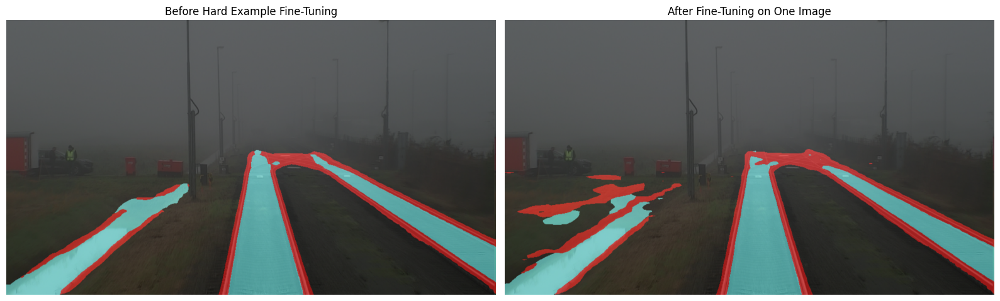

In [3]:
# Load both results (before and after hard-example fine-tuning)
img_before = cv2.imread("output/hard_example_comparison/result_before.png")
img_after = cv2.imread("output/hard_example_comparison/result_after.png")

# Convert BGR to RGB for matplotlib
img_before = cv2.cvtColor(img_before, cv2.COLOR_BGR2RGB)
img_after = cv2.cvtColor(img_after, cv2.COLOR_BGR2RGB)

# Plot side-by-side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes[0].imshow(img_before)
axes[0].set_title("Before Hard Example Fine-Tuning")
axes[0].axis("off")

axes[1].imshow(img_after)
axes[1].set_title("After Fine-Tuning on One Image")
axes[1].axis("off")

plt.tight_layout()
plt.show()


### Final Attempt: Combined Fine-Tuning on Clear Images + Hard Example

After observing that training on a single foggy image led to catastrophic forgetting, we adopted a more balanced strategy: combining all annotated **clear images** with the **duplicated hard example** into a single training set.

This ensures the model retains its general understanding of rail tracks under clear conditions, while also learning to correctly handle the specific challenging foggy case that previously led to a false positive.

Key parameters:
- Combined dataset: `clear/` + `hard_example/`
- Epochs: 20
- Batch size: 4
- Learning rate: 1e-4
- Augmentations: Horizontal flip, brightness/contrast, gamma, and Gaussian blur


### Final Comparison: Pseudo-Label Model vs. Combined Fine-Tuning

The following images show the output of the segmentation model **before** and **after** the final combined training:

- **Before**: Trained on pseudo-labels from clear images only.
- **After**: Trained on both the pseudo-labeled clear dataset and the manually-labeled hard example.

This comparison, hopfully, will helps verify whether the FP behavior observed earlier was successfully corrected without degrading general performance.


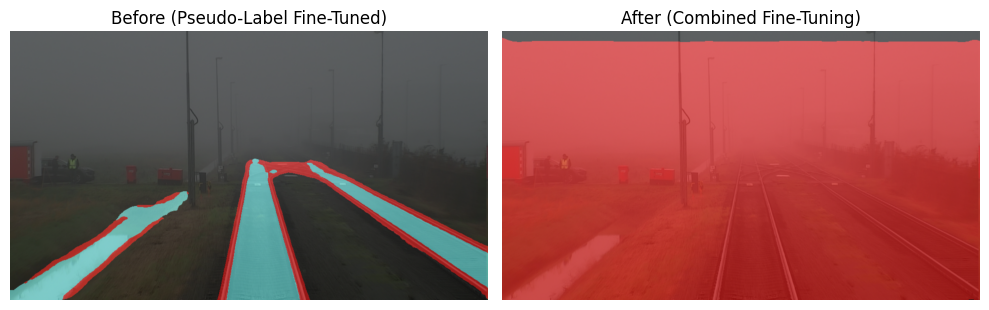

In [6]:
# Load images
img_before = cv2.imread("output/hard_example_comparison/result_before.png")
img_after = cv2.imread("output/hard_example_comparison_combined/result_after_combined.png")

# Convert to RGB
img_before = cv2.cvtColor(img_before, cv2.COLOR_BGR2RGB)
img_after = cv2.cvtColor(img_after, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(img_before)
axes[0].set_title("Before (Pseudo-Label Fine-Tuned)")
axes[0].axis("off")

axes[1].imshow(img_after)
axes[1].set_title("After (Combined Fine-Tuning)")
axes[1].axis("off")

plt.tight_layout()
plt.show()

### Final Combined Fine-Tuning Attempt — Failed Outcome

In a final effort to resolve the FP on the foggy image, we combined:
- All pseudo-labeled `clear` images
- The manually-labeled hard example (image `...1344`, duplicated)

The goal was to retain general performance while teaching the model to handle the specific challenging case.

However, the result was significantly worse:
- The entire image was over-segmented
- Everything was predicted as a railway track, indicating the model lost its generalization ability

#### Probable Reasons:
- Overfitting on the duplicated hard example
- Class imbalance or domain conflict between clear and fog images
- Too small a batch or too few samples per category

This experiment highlights the risks of over-representing a single sample in training.  
Alternative strategies such as confidence-based pseudo-labeling or unpaired domain adaptation are recommended.
